# Predicting Daily Land Average Temperature

Importing the required libraries for the ml modelling

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

##  Load the Data
Load the daily land-surface average anomaly data provided by Berkeley Earth collected from 1880 to 2022.

In [2]:
import pandas as pd

url = "https://berkeley-earth-temperature.s3.us-west-1.amazonaws.com/Global/Complete_TAVG_daily.txt"

'''
read the data from the url link
ignore the comments starting with '%'
ignore the header in the comments and assign manually
'''
df = pd.read_csv(url, sep=r"\s+", comment="%", header=None)

# assign column headers
column_names = ["Date Number", "Year", "Month", "Day", "Day of Year", "Anomaly"]
df.columns = column_names

#df.to_csv("data/raw.csv", index=False)

### Data Pre Processing 

In [3]:
df = df.drop(columns=['Date Number'])

In [4]:
BASELINE_TEMP = 8.59  # Jan 1951–Dec 1980 land-average temperature in celsius

df['Temperature'] = df['Anomaly'] + BASELINE_TEMP

In [5]:
month_dict = {
    1: 'January',
    2: 'February',
    3: 'March',
    4: 'April',
    5: 'May',
    6: 'June',
    7: 'July',
    8: 'August',
    9: 'September',
    10: 'October',
    11: 'November',
    12: 'December'
}

df['Month_Name'] = df['Month'].map(month_dict)

# Exploratory Data Analysis (EDA)

The goal of this EDA is to determine what type of predictive model will be the best fit for the data. A suitable regression method is to explored, as the target (global average land temperature) is continuous. After preprocessing the dataset, no presence of null values were found requiring attention. In order to make the Month_Name (converting from Month) feature more readable during EDA, the feature was converted to an ordinal feature, with Jan as the first in the order and December as the last in the order. Monthly trends in the data were considered over the years, however overall trends were found irrespective of the month the data was collected in. A cutoff year was decided for splitting the data into test and training data sets (see code below), and EDA was carried out on only the training portion of the data set to avoid violating the golden rule and double dipping. A randomized test split was not implemented as the model is desired for predicting temperatures in the future, so test data taken from the latest measurements represents the best evaluation of the regression model. Once the dataset was split, EDA was performed with several visualization strategies, the most informative of which are presented below. Discussions of the findings and rationale are found below as well.

In [6]:
# Quick view of data and columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52077 entries, 0 to 52076
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Year         52077 non-null  int64  
 1   Month        52077 non-null  int64  
 2   Day          52077 non-null  int64  
 3   Day of Year  52077 non-null  int64  
 4   Anomaly      52077 non-null  float64
 5   Temperature  52077 non-null  float64
 6   Month_Name   52077 non-null  object 
dtypes: float64(2), int64(4), object(1)
memory usage: 2.8+ MB


In [7]:
# Overview of statistics
df.describe()

,Year,Month,Day,Day of Year,Anomaly,Temperature
count,52077.000000,52077.000000,52077.000000,52077.000000,52077.000000,52077.000000
mean,1950.791693,6.512779,15.729228,182.688577,0.098503,8.688503
std,41.160470,3.447762,8.799991,105.302088,0.673085,0.673085
min,1880.000000,1.000000,1.000000,1.000000,-2.728000,5.862000
25%,1915.000000,4.000000,8.000000,92.000000,-0.340000,8.250000
50%,1951.000000,7.000000,16.000000,183.000000,0.013000,8.603000
75%,1986.000000,10.000000,23.000000,274.000000,0.498000,9.088000
max,2022.000000,12.000000,31.000000,365.000000,2.955000,11.545000


In [8]:
# Verify no null values
df.isna().any()

Year           False
Month          False
Day            False
Day of Year    False
Anomaly        False
Temperature    False
Month_Name     False
dtype: bool

In [9]:
# month order from above dict values
month_order = list(month_dict.values())
month_order

['January',
 'February',
 'March',
 'April',
 'May',
 'June',
 'July',
 'August',
 'September',
 'October',
 'November',
 'December']

In [10]:
# Order the month names as categorical
df['Month_Name'] = pd.Categorical(df['Month_Name'], categories=month_order, ordered=True)
df['Month_Name']

0        January
1        January
2        January
3        January
4        January
          ...   
52072       July
52073       July
52074       July
52075       July
52076       July
Name: Month_Name, Length: 52077, dtype: category
Categories (12, object): ['January' < 'February' < 'March' < 'April' ... 'September' < 'October' < 'November' < 'December']

In [11]:
# Split into test and train dataframes based on decided cutoff
# Beyond which the model will be scored and used for prediction
cutoff = 2012
test_df = df[df['Year'] > cutoff]
test_df

,Year,Month,Day,Day of Year,Anomaly,Temperature,Month_Name
48578,2013,1,1,1,0.489,9.079,January
48579,2013,1,2,2,0.429,9.019,January
48580,2013,1,3,3,0.572,9.162,January
48581,2013,1,4,4,0.816,9.406,January
48582,2013,1,5,5,0.769,9.359,January
...,...,...,...,...,...,...,...
52072,2022,7,27,208,1.639,10.229,July
52073,2022,7,28,209,1.631,10.221,July
52074,2022,7,29,210,1.574,10.164,July
52075,2022,7,30,211,1.577,10.167,July


In [12]:
# Get training data based on decided cutoff
train_df = df[df['Year'] <= cutoff]
train_df

,Year,Month,Day,Day of Year,Anomaly,Temperature,Month_Name
0,1880,1,1,1,-0.692,7.898,January
1,1880,1,2,2,-0.592,7.998,January
2,1880,1,3,3,-0.673,7.917,January
3,1880,1,4,4,-0.615,7.975,January
4,1880,1,5,5,-0.681,7.909,January
...,...,...,...,...,...,...,...
48573,2012,12,27,361,0.134,8.724,December
48574,2012,12,28,362,0.371,8.961,December
48575,2012,12,29,363,0.532,9.122,December
48576,2012,12,30,364,0.594,9.184,December


In [13]:
import altair as alt

# Simplify Working with Large Datasets 
alt.data_transformers.enable('vegafusion')

# Ignore all warnings from the altair package for pdf rendering, warnings validated first
# resource for implementation:
# https://stackoverflow.com/questions/3920502/how-to-suppress-a-third-party-warning-using-warnings-filterwarnings
import warnings
warnings.filterwarnings('ignore', module='altair')

# Configure Plot Sizes for pdf (D.R.Y)
plot_size = {'width': 450, 'height': 300}
facet_plot_size = {'width': 250, 'height': 200}

Due to the many measurements that occur in each year (contributing to plotting noise), the mean of the temperatures for each group of measurements taken in a year were plotted in addition to the raw data points of temperature over time. A general trend of increasing temperature over time with local fluctuations can be observed below.

In [14]:
# Create scatter of raw data with some opacity to reduce plot noise
temp_points = alt.Chart(train_df,
        title=alt.Title(
        text='Global Daily Average Land Temperature',
        subtitle='Mean Temperature (Red Line)')
        ).mark_point(opacity=0.6, size=1).encode(
    x = 'Year:T',
    y = 'Temperature:Q')

# Create line plot of the mean of all the measurements in a given year 
temp_line_mean = temp_points.mark_line(size=2, color='red').encode(
    x = alt.X('Year:T', title='Year'),
    y = alt.Y('mean(Temperature):Q', title='Temperature [°C]'
              ).scale(zero=False) 
).properties(**plot_size)

# show the raw data distribution along with mean by year
temp_points+temp_line_mean

alt.LayerChart(...)

Using the mean data points by year, a linear regression model was fit to the training data to assess the viability of this approach in prediction. The linear regression fit can be seen to follow the overall trend, but misses information about local fluctuations, seen by the points above and below the line. A linear model has potential to generalize for unseen year examples but may be too simple for this analysis and will not be precise in its predictions for every year. A 5-year rolling average was also explored, due to its ability to adapt the curve more effectively to local fluctuations. However, a model of this type may not extrapolate well for unseen examples to predict future temperatures.

In [15]:
# PLot a scatter plot of the mean temperatures for each year
temp_points_avg = alt.Chart(train_df,
        title=alt.Title(
        text='Annual Means of Global Daily Average Land Temperature',
        subtitle='Linear Regression Indicated by Red Line')
    ).mark_point(size=2).encode(
    x = alt.X('Year:T', title='Year'),
    y = alt.Y('mean(Temperature):Q', 
              title='Temperature [°C]').scale(zero=False) 
)

# Add the regression line to the scatter plot and properties
reg = temp_points_avg+temp_points_avg.mark_line(
    size=2, color='red').transform_regression(
    'Year',
    'Temperature'
).properties(**plot_size)
 
# Show the regression plot
reg

alt.LayerChart(...)

In order to check if the global average daily temperature over time was affected by seasonal phenomena, the annual means of these temperature measurements were analyzed by each month separated. It can be seen from the facet plot below that regardless of the season global daily average land temperature measurements are increasing non-trivially over time.

In [16]:
# Average by year for each month in data
mean_per_month = train_df.groupby(
    ['Year','Month_Name'], observed=True)['Temperature'].mean().reset_index()

# For empty plotting title
mean_per_month[' ']=mean_per_month['Month_Name']

# Create Mean temperature plots and facet by month
temp_plot = alt.Chart(mean_per_month).mark_line().encode(
    x = 'Year:T',
    y = alt.Y('Temperature:Q', title='Temperature [°C]').scale(zero=False)
).properties(**facet_plot_size).facet(' ', columns=2)

# Show the plot with overall title
final_figure = alt.hconcat(temp_plot).properties(
    title='Seasonality of Annual Means of Global Daily Average Land Temperature')
final_figure

alt.HConcatChart(...)

Finally, the distribution of the training data for temperature with respect to distinct year separated in by approximately 60 years were evaluated for distinct eras in the density plot below. The last year in the training data set (the cutoff year defined above) can be seen as significantly shifted to the right, indicating the increase in global daily average land temperature across time. Three distinct peaks in the density plot below reinforces the hypothesis that even when account for the variance in temperature due to local fluctuations, the overall trend of global temperature increasing over time remains.

In [17]:
# Years to be analyzed separated by ~60 years
years_selection = [1880, 1960, cutoff]

# Select necessary data only
data_subset = train_df[train_df['Year'].isin(years_selection)]

# Create density plot for each selected year and add opacity to view overlap
temp_density  = alt.Chart(data_subset
    ).transform_density(
    'Temperature',
    groupby=['Year'],
    as_=['Temperature', 'density']
).mark_area(opacity=0.6).encode(
    x=alt.X('Temperature',title='Temperature [°C]'),
    y=alt.Y('density:Q',title='Density').stack(False),
    color = 'Year:N'
).properties(**plot_size, title = 'Distributions of Global Daily Average Land Temperature')

# Display the density plots by select years
temp_density

alt.Chart(...)

## Machine Learning Modelling 

Here we convert daily climate data into yearly averages by creating a proper datetime index, resampling the anomaly values to annual means, and preparing the data for modeling by extracting the numerical year and separating it into feature (X) and target (y) arrays. Yearly averages smooth out short-term noise and make long-term climate trends easier to model, and using the year as the feature allows the machine-learning models to learn how temperature anomalies evolve over time.

In [18]:
# -----------------------------------------------------------
# 1. Convert daily data → yearly averages
# -----------------------------------------------------------

# Combine Year–Month–Day into a proper datetime column
df['Date'] = pd.to_datetime(df[['Year', 'Month', 'Day']])

# Use Date as index so resampling works correctly
df.set_index('Date', inplace=True)

# Resample to yearly means (YE = year-end)
yearly = df['Anomaly'].resample('YE').mean().reset_index()

# Extract year number from datetime column
yearly['Year'] = yearly['Date'].dt.year

# Feature matrix X (year), target vector y (anomaly)
X = yearly[['Year']].values
y = yearly['Anomaly'].values

We split the data into a training set (years up to 2012) and a test set (years after 2012) by creating boolean masks based on the chosen split year. It then uses those masks to separate the feature matrix and target values into training and testing subsets. By training on earlier years and testing on later years, we evaluate how well the model predicts future climate patterns rather than just fitting past data. A good model should perform well on the test set, meaning it can generalize to years it has never seen before.

In [19]:
# -----------------------------------------------------------
# 2. Train–Test Split (train: up to 2012, test: after 2012)
# -----------------------------------------------------------

split_year = 2012  # last 10 years are used for testing

train_mask = yearly['Year'] <= split_year
test_mask  = yearly['Year'] > split_year

X_train, y_train = X[train_mask], y[train_mask]
X_test,  y_test  = X[test_mask], y[test_mask]

Three different machine-learning models are defined which are Linear Regression, Random Forest, and a Support Vector Regressor (SVR) with scaling—so we can compare how well each one predicts yearly temperature anomalies. Each model captures patterns differently, ranging from simple linear trends to more flexible non-linear relationships.

In [20]:
# -----------------------------------------------------------
# 3. Define Models
# -----------------------------------------------------------

models = {
    "Linear Regression": LinearRegression(),
    "Random Forest": RandomForestRegressor(n_estimators=200, random_state=42),
    "SVR": Pipeline([
        ('scaler', StandardScaler()),
        ('svr', SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.01))
    ])
}

WE train each defined model on the training data, predicts anomalies for the test years, and calculates key evaluation metrics (RMSE, MAE, R²) to measure prediction accuracy. The results are stored in a table for easy comparison of model performance.

In [21]:
# -----------------------------------------------------------
# 4. TRAIN, PREDICT & EVALUATE (Output results as table)
# -----------------------------------------------------------

results = {}

for name, model in models.items():
    model.fit(X_train, y_train)                     # Train
    y_pred = model.predict(X_test)                  # Predict
    rmse = np.sqrt(mean_squared_error(y_test, y_pred)) 
    mae  = mean_absolute_error(y_test, y_pred)      
    r2   = r2_score(y_test, y_pred)                 # Evaluate

    results[name] = {"RMSE": rmse, "MAE": mae, "R2": r2}

# Convert results dictionary → nice DataFrame table
results_table = pd.DataFrame(results).T
print("\nModel Performance on Test Set:\n")
print(results_table)


Model Performance on Test Set:

                       RMSE       MAE         R2
Linear Regression  0.539126  0.521939 -11.652955
Random Forest      0.350576  0.316120  -4.350267
SVR                0.145067  0.120141   0.083892


Lower RMSE and MAE values indicate more accurate predictions, while a higher (positive) R² shows the model explains more variance in the data. From the table, SVR has the lowest errors and a positive R², making it the best model to use for forecasting.

In [22]:
# -----------------------------------------------------------
# 5. Select Best Model (based on RMSE)
# -----------------------------------------------------------

best_model_name = results_table["RMSE"].idxmin()
best_model = models[best_model_name]
print(f"\nBest model: {best_model_name}")


Best model: SVR


We use the selected best model (SVR) to predict the temperature anomaly for the year 2030 and then adds it to the baseline temperature to estimate the actual land-average temperature.

In [23]:
# -----------------------------------------------------------
# 6. Forecast Temperature Anomaly for 2030
# -----------------------------------------------------------

year_2030 = np.array([[2030]])
forecast_2030_anomaly = best_model.predict(year_2030)[0]

forecast_2030_temp = BASELINE_TEMP + forecast_2030_anomaly

print(f"\nPredicted anomaly for 2030: {forecast_2030_anomaly:.4f} °C")
print(f"Predicted land-average temperature for 2030: {forecast_2030_temp:.4f} °C")


Predicted anomaly for 2030: 1.9696 °C
Predicted land-average temperature for 2030: 10.5596 °C


The predicted anomaly of **≈1.97 °C** indicates that 2030 is expected to be nearly 2 °C warmer than the baseline period. Adding this to the baseline gives a land-average temperature of **≈10.56 °C**, showing a continuation of the observed warming trend.


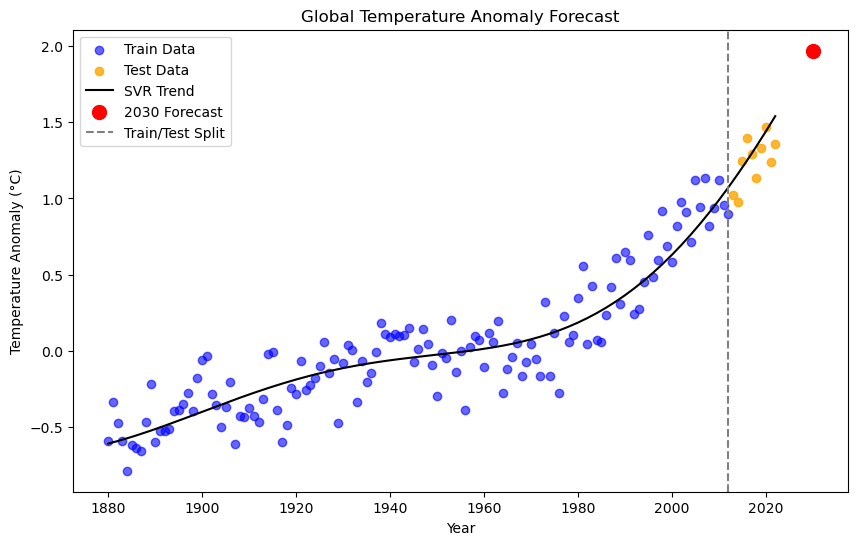

In [24]:
# -----------------------------------------------------------
# 7. PLOT RESULTS
# -----------------------------------------------------------

plt.figure(figsize=(10,6))

# Plot TRAIN data (blue)
plt.scatter(
    yearly['Year'][train_mask],
    yearly['Anomaly'][train_mask],
    alpha=0.6,
    color='blue',
    label="Train Data"
)

# Plot TEST data (orange/red)
plt.scatter(
    yearly['Year'][test_mask],
    yearly['Anomaly'][test_mask],
    alpha=0.8,
    color='orange',
    label="Test Data"
)

# Model trend line
plt.plot(yearly['Year'], best_model.predict(X), color='black', label=f"{best_model_name} Trend")

# 2030 Forecast point
plt.scatter(2030, forecast_2030_anomaly, color='red', s=100, label="2030 Forecast")

# Train-test split line
plt.axvline(split_year, color='gray', linestyle='--', label="Train/Test Split")

plt.xlabel("Year")
plt.ylabel("Temperature Anomaly (°C)")
plt.title("Global Temperature Anomaly Forecast")
plt.legend()
plt.show()

The plot shows the historical anomalies, with training data in blue and test data in orange, allowing us to visually compare the model’s predictions against unseen years. The black trend line from the SVR model captures the warming pattern, while the red point highlights the 2030 forecast, illustrating the expected continuation of the temperature rise.

The trend line closely follows historical data, test points are reasonably well-predicted, and the red forecast indicates that temperature anomalies are expected to continue rising, consistent with recent warming trends.